# Testing AG Coordinate with weight smoothing

This notebook evaluates the performance of the AG coordinate using a single density slice snapshot from the ANU-tub configuration. The AG coordinate is calculated using Angus' `pyale` package - these calculations are done within the notebook.

These calculations are based on the May 2024 version of the code which smooths the density and pressure adaptivity weights after they are calculated

The `pyale` code is fortran-based, and pretty slow, so best to enable OpenMP to use multi-threading. Note that the cell below needs to be in the environment *before* OpenMP is initialised, which happens when you import the `pyale` module. Ideal is to match the number of threads with the number of cores available.

In [1]:
import os
os.environ["OMP_NUM_THREADS"] = str(28)

Import precompiled `pyale` code - note that you will need to match the python version here, or recompile to a newer version of python if that fails.

In [1]:
import toml
import sys
sys.path = ["/g/data/x77/ahg157/python-ale/build/lib.linux-x86_64-cpython-310"] + sys.path
import pyale

Import other standard plotting stuff.

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cmocean as cm

## Load grid information into dataset

This just uses a random restart file copied locally.

In [3]:
restart_filename = '/g/data/x77/amh157/anu-tub/diagnostics/INPUTS/MOM.res.nc'

In [4]:
ds2 = xr.open_dataset(restart_filename,decode_times=False)

Text(0.5, 1.0, 'Temperature')

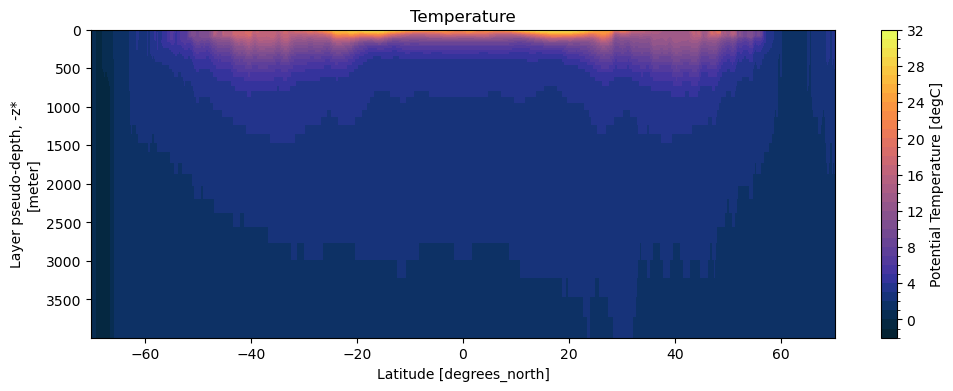

In [5]:
vlev = np.linspace(-2,32,35)
plt.figure(figsize=(12,4))
ds2.Temp.isel(Time=0).isel(lonh=39).plot(levels=vlev,cmap=cm.cm.thermal)
plt.gca().invert_yaxis()
plt.title('Temperature')

## Plotting function


In [52]:
def tpplot(field,h,vlev=50,cmap=cm.cm.thermal,title=''):
    plt.figure(figsize=(12,6))
    plt.subplot(211)
    p1 = field.plot(y = "depth",add_colorbar=False,levels=vlev,cmap=cmap)
    for ii in range(75):
        if np.mod(ii,10)==5:
            plt.plot(field.yh.values,h[:,ii],'m',linewidth=0.6)
        else:
            plt.plot(field.yh.values,h[:,ii],'w',linewidth=0.3)
    plt.ylim([0,500])
    plt.gca().invert_yaxis()
    plt.title(title)
    plt.subplot(212)
    p1 = field.plot(y = "depth",add_colorbar=False,levels=vlev,cmap=cmap)
    for ii in range(75):
        if np.mod(ii,10)==5:
            plt.plot(field.yh.values,h[:,ii],'m',linewidth=0.6)
        else:
            plt.plot(field.yh.values,h[:,ii],'w',linewidth=0.3)
    plt.ylim([500,4000])
    plt.gca().invert_yaxis()
    plt.subplots_adjust(hspace=0)
    ax_c = plt.axes([0.92,0.3,0.01,0.4])
    plt.colorbar(p1,ax_c)
    return


def spplot(field,h,vlev=50,cmap=cm.cm.thermal,title='',col='w'):
    p1 = field.plot(y = "depth",add_colorbar=False,levels=vlev,cmap=cmap)
    for ii in range(75):
        if np.mod(ii,10)==5:
            plt.plot(field.yh.values,h[:,ii],'m',linewidth=0.6)
        else:
            plt.plot(field.yh.values,h[:,ii],col,linewidth=0.3)
            
    def forward(x):
        return x**(1/3)
    def inverse(x):
        return x**3

    plt.xlim([-70,-10])
    plt.ylim([2,4000])    
    plt.gca().set_yscale('function', functions=(forward, inverse))
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.title(title)
    
    return p1


## Load precomputed cases:

In [11]:
sc_cases = ['state_sc001','state_sc002','state_def','state_sc01']
cutoff_value = [0.001, 0.002, 0.005, 0.01]

In [56]:
def gpplot(field,h,vlev=50,cmap=cm.cm.thermal,title='',col='w'):
    p1 = field.plot(y = "depth",add_colorbar=False,levels=vlev,cmap=cmap)
    for ii in range(75):
        if np.mod(ii,10)==5:
            plt.plot(field.yh.values,h[:,ii],'m',linewidth=0.6)
        else:
            plt.plot(field.yh.values,h[:,ii],col,linewidth=0.3)
            
    def forward(x):
        return x**(1/3)
    def inverse(x):
        return x**3

    plt.ylim([2,4000])    
    plt.gca().set_yscale('function', functions=(forward, inverse))
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.title(title)
    
    return p1

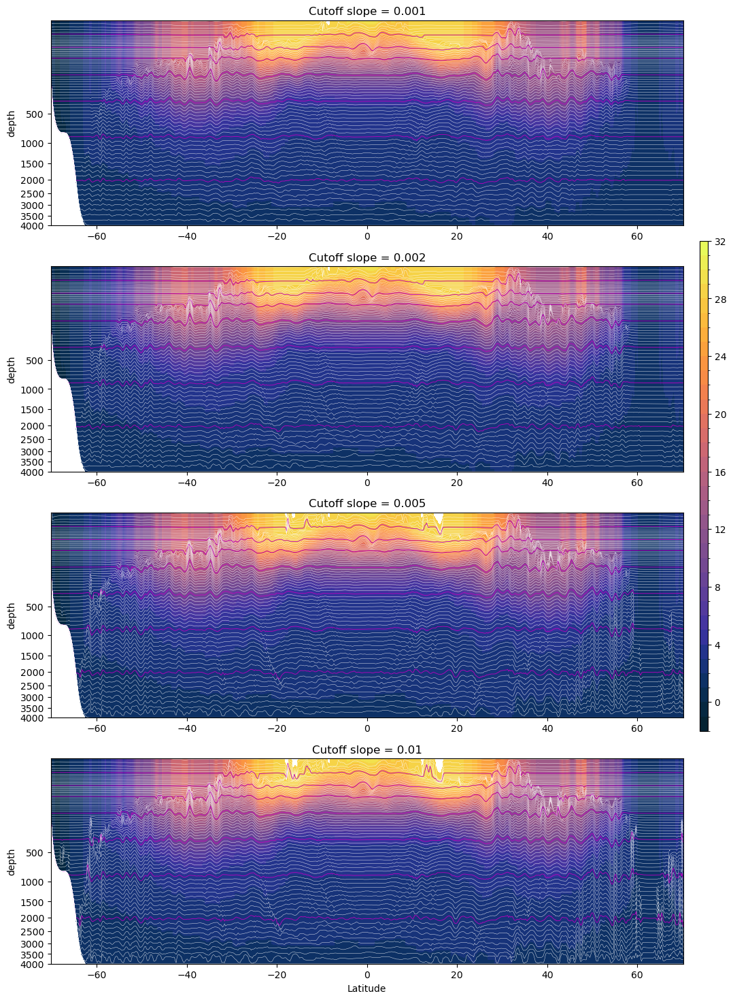

In [53]:
plt.figure(figsize=(12,18))
for ii in range(4):
    state=np.load('/g/data/x77/amh157/anu-tub/diagnostics/'+sc_cases[ii]+'.npy',allow_pickle=True)
    h=state[0]
    temp=state[1]
    h_depth = np.cumsum(h[39,:,:],1)
    new_temp = xr.DataArray(data=np.transpose(temp[39,:,:]),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))   
    plt.subplot(4,1,ii+1)
    p1 = gpplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='Cutoff slope = '+str(cutoff_value[ii]))
    if ii<3:
        plt.xlabel('')

ax_c = plt.axes([0.92,0.3,0.01,0.4])
plt.colorbar(p1,ax_c)

**The above plots** show a N-S transect of temperature, with the coordinate interfaces for different values of the slope cutoff parameter. At small cutoff slope there is a larger area of flat interfaces; at larger cutoff slopes the region of quasi-isopycnal interfaces increases, noting that the occurrence of sharp interface deviations also increase.

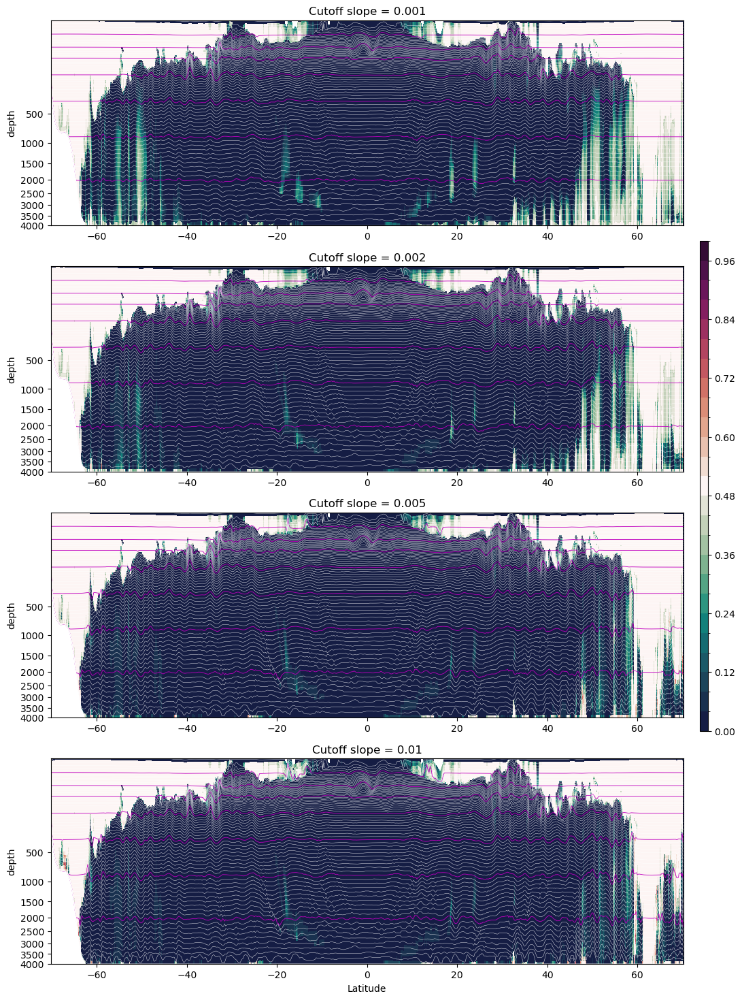

In [55]:
plt.figure(figsize=(12,18))
for ii in range(4):
    state=np.load('/g/data/x77/amh157/anu-tub/diagnostics/'+sc_cases[ii]+'.npy',allow_pickle=True)
    h=state[0]
    diags = state[3]
    diag_phys_v = xr.DataArray(data=(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
                coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
    diag_coord_v = xr.DataArray(data=(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],
                coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
    ratio = diag_coord_v/(diag_coord_v+diag_phys_v+0.00001)

    plt.subplot(4,1,ii+1)
    h_depth = np.cumsum(h[39,:,:],1)
    p1 = gpplot(ratio,h_depth,vlev=np.linspace(0,1,26),cmap=cm.cm.curl,title='Cutoff slope = '+str(cutoff_value[ii]))
    if ii<3:
        plt.xlabel('')

ax_c = plt.axes([0.92,0.3,0.01,0.4])
plt.colorbar(p1,ax_c)


**These plots** take the meridional gradient of density in physical and coordinate space. We calculate the ratio of the coordinate slope to the physical+coordinate slope (+ epsilon). In regions where this ratio is zero (dark green) the coordinate is closely following isopycnals. In regions where it is 0.5 (white) the physical and coordinate slopes are equal, meaning that the coordinate is close to geopotential. (There should be no regions > 0.5 (red). This diagnostic highlights that most of the interopr ocean is quasi-isopycnal with this coordinate. It also shows the trade-off between cutoff slope and noisy interfaces. And it confirms that the lateral smoothing has a minimal effect on the large scale behaviour of the adaptive coordinate.

------
## The code below is to precompute the interfaces based on different input parameters

In [ ]:
def diagplot(diags):
    plt.figure(figsize=(14,6))
    diag_density = xr.DataArray(data=np.transpose(diags['adapt_disp_density'][43,3:-4,:-1]),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))   

    plt.subplot(221)
    p1 = diag_density.plot(y = "depth")
    plt.gca().invert_yaxis()
    plt.title('adapt_disp_density')

    diag_smoothing = xr.DataArray(data=np.transpose(diags['adapt_disp_smoothing'][43,3:-4,:-1]),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
    plt.subplot(222)
    p1 = diag_smoothing.plot(y = "depth")
    plt.gca().invert_yaxis()
    plt.title('adapt_disp_smoothing')

    diag_unlimited = xr.DataArray(data=np.transpose(diags['adapt_disp_unlimited'][43,3:-4,:-1]),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
   # plt.subplot(223)
   # p1 = diag_unlimited.plot(y = "depth")
   # plt.gca().invert_yaxis()
   # plt.title('adapt_disp_unlimited')

    diag_phys_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
    plt.subplot(223)
    p1 = diag_phys_v.plot(y = "depth")
    plt.ylim([2,4000])
    def forward(x):
        return x**(1/3)
    def inverse(x):
        return x**3
    plt.gca().set_yscale('function', functions=(forward, inverse))

    plt.gca().invert_yaxis()
    plt.title('adapt_phys_u')

    diag_coord_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],
        coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth)))) 
    plt.subplot(224)
    p1 = diag_coord_v.plot(y = "depth")
    plt.ylim([2,4000])
    def forward(x):
        return x**(1/3)
    def inverse(x):
        return x**3
    plt.gca().set_yscale('function', functions=(forward, inverse))

    plt.gca().invert_yaxis()
    plt.title('adapt_coord_v')

    diag_total = diag_density + diag_smoothing + diag_unlimited 

#    plt.subplot(224)
#    p1 = diag_total.plot(y = "depth")
#    plt.gca().invert_yaxis()
#    plt.title('total')

    plt.figure(figsize=(14,4))

    plt.subplot(131)
    plt.plot(diag_total.yh[150:350],temp[39,150:350,48])
    plt.title('temp')

    ax = plt.subplot(132)
    ax.plot(diag_total.yh[150:350],h_depth[150:350,48],label='h')
    plt.legend()
    ax2=ax.twinx()
    diag_total.isel(zl=48).isel(yh=slice(150,350)).plot(ax=ax2,color='r',label='total')
    plt.legend(loc=4)

    plt.subplot(133)
    diag_density.isel(zl=48).isel(yh=slice(150,350)).plot(label='density')
    diag_unlimited.isel(zl=48).isel(yh=slice(150,350)).plot(label='unlimited')
    diag_smoothing.isel(zl=48).isel(yh=slice(150,350)).plot(label='smoothing')
    diag_total.isel(zl=48).isel(yh=slice(150,350)).plot(label='total')
    plt.legend()
    return

## Do base case with standard parameters
This function reads in the parameters from the default `.toml` file, and sets up the function. Note that we have optimised default parameters and specify updated parameters manually -- see `Evaluate_AG_Coord.ipynb` for details. 

In [8]:
params = toml.load("/g/data/x77/amh157/anu-tub/diagnostics/params_adapt.toml")
cs = pyale.mom_init_cs(params); 

 log_version: MOM_domains                             , unknown
 MOM_domains                              REENTRANT_X:  T
 MOM_domains                              REENTRANT_Y:  F
 MOM_domains                              TRIPOLAR_N:  F
 MOM_domains                              OCEAN_OMP_THREADS:            1
 MOM_domains                              OCEAN_OMP_HYPER_THREAD:  F
 MOM_domains                              !SYMMETRIC_MEMORY_:  T
 MOM_domains                              NONBLOCKING_UPDATES:  F
 MOM_domains                              THIN_HALO_UPDATES:  T
 MOM_domains                              !STATIC_MEMORY_:  F
 MOM_domains                              NIGLOBAL:          160
 MOM_domains                              NJGLOBAL:          800
 MOM_domains                              NIHALO:            4
 MOM_domains                              NJHALO:            4
 MOM_domains                              MASKTABLE: 'MOM_mask_table'
 MOM_domains                         

In [9]:
pyale.load_mom_restart(cs, restart_filename)
adapt_cs = pyale.mom_init_regrid(cs, params, "ADAPTIVE")

 init_MOM_state INPUTDIR: '/g/data/x77/amh157/mom6/input/anu-tub'
 init_MOM_state REGRIDDING_COORDINATE_UNITS: 'm'
 init_MOM_state INTERPOLATION_SCHEME: 'P1M_H2'
 init_MOM_state DEFAULT_2018_ANSWERS:  F
 init_MOM_state REMAPPING_2018_ANSWERS:  F
 init_MOM_state BOUNDARY_EXTRAPOLATION:  F
 init_MOM_state ALE_COORDINATE_CONFIG                   : 'FNC1:2,4000,4.5,.01'
 init_MOM_state !ALE_RESOLUTION                          :    2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0099999999999998        2.0099999999999998        2.0200000000000000        2.0299999999999998        2.0499999999999998        2.0800000000000001        2.1099999999999999        2.1499999999999999        2.2100000000000000        2.2800000000000002        2.3700000000000001        2.4800000000000000        2.6099999999999999        2.7700000000000000        2.9500000000000002     

In [10]:
state_def = pyale.accelerate_ale(cs, adapt_cs, iter=500, dt=3600,diags=["adapt_disp_density","adapt_disp_smoothing","adapt_disp_unlimited","adapt_phys_v","adapt_coord_v"])

h=state_def[0]
temp=state_def[1]
salt=state_def[2]
diags = state_def[3]


/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:78: RuntimeWarning: divide by zero encountered in log10
  diag_phys_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:92: RuntimeWarning: divide by zero encountered in log10
  diag_coord_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],


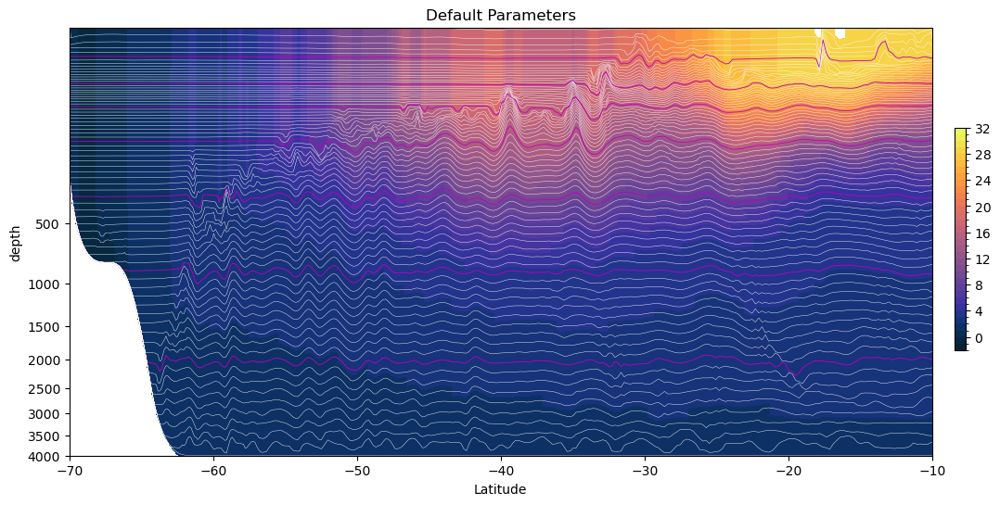

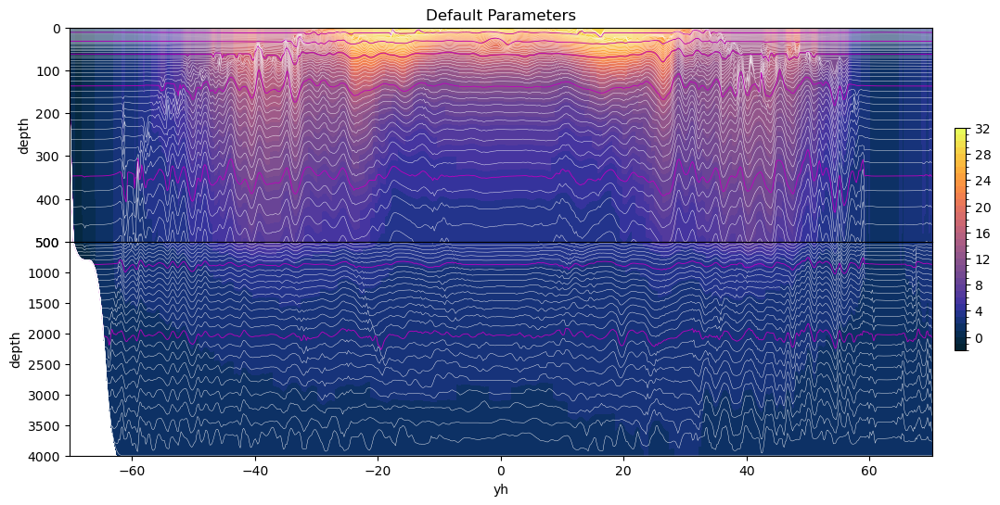

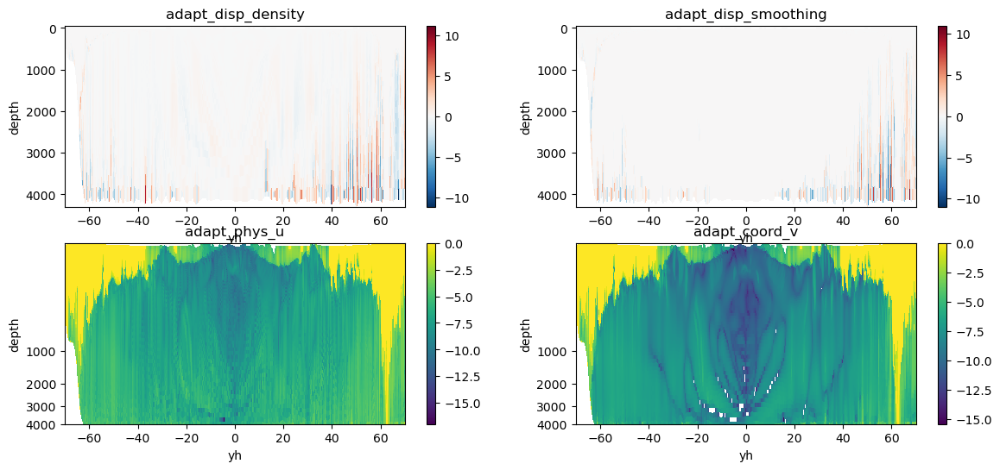

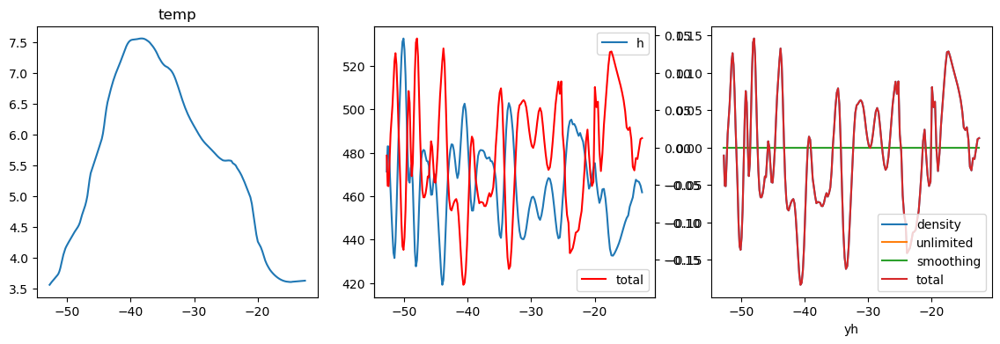

In [11]:
h_depth = np.cumsum(h[39,:,:],1)
new_temp = xr.DataArray(data=np.transpose(temp[39,:,:]),dims=["zl", "yh"],
            coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))    
spplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='Default Parameters')
tpplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='Default Parameters')
diagplot(diags)

In [20]:
np.save('/g/data/x77/amh157/anu-tub/diagnostics/state_def.npy',state_def,allow_pickle=True)

## Try flatter slope cutoff.

In [21]:
params = toml.load("/g/data/x77/amh157/anu-tub/diagnostics/params_adapt.toml")
params["ADAPT_SLOPE_CUTOFF"] =  0.002
cs = pyale.mom_init_cs(params); 

 log_version: MOM_domains                             , unknown
 MOM_domains                              REENTRANT_X:  T
 MOM_domains                              REENTRANT_Y:  F
 MOM_domains                              TRIPOLAR_N:  F
 MOM_domains                              OCEAN_OMP_THREADS:            1
 MOM_domains                              OCEAN_OMP_HYPER_THREAD:  F
 MOM_domains                              !SYMMETRIC_MEMORY_:  T
 MOM_domains                              NONBLOCKING_UPDATES:  F
 MOM_domains                              THIN_HALO_UPDATES:  T
 MOM_domains                              !STATIC_MEMORY_:  F
 MOM_domains                              NIGLOBAL:          160
 MOM_domains                              NJGLOBAL:          800
 MOM_domains                              NIHALO:            4
 MOM_domains                              NJHALO:            4
 MOM_domains                              MASKTABLE: 'MOM_mask_table'
 MOM_domains                         

In [22]:
pyale.load_mom_restart(cs, restart_filename)
adapt_cs = pyale.mom_init_regrid(cs, params, "ADAPTIVE")

 init_MOM_state INPUTDIR: '/g/data/x77/amh157/mom6/input/anu-tub'
 init_MOM_state REGRIDDING_COORDINATE_UNITS: 'm'
 init_MOM_state INTERPOLATION_SCHEME: 'P1M_H2'
 init_MOM_state DEFAULT_2018_ANSWERS:  F
 init_MOM_state REMAPPING_2018_ANSWERS:  F
 init_MOM_state BOUNDARY_EXTRAPOLATION:  F
 init_MOM_state ALE_COORDINATE_CONFIG                   : 'FNC1:2,4000,4.5,.01'
 init_MOM_state !ALE_RESOLUTION                          :    2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0099999999999998        2.0099999999999998        2.0200000000000000        2.0299999999999998        2.0499999999999998        2.0800000000000001        2.1099999999999999        2.1499999999999999        2.2100000000000000        2.2800000000000002        2.3700000000000001        2.4800000000000000        2.6099999999999999        2.7700000000000000        2.9500000000000002     

In [23]:
state_sc002 = pyale.accelerate_ale(cs, adapt_cs, iter=500, dt=3600,diags=["adapt_disp_density","adapt_disp_smoothing","adapt_disp_unlimited","adapt_phys_v","adapt_coord_v"])

h=state_sc002[0]
temp=state_sc002[1]
salt=state_sc002[2]
diags = state_sc002[3]


/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:78: RuntimeWarning: divide by zero encountered in log10
  diag_phys_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:92: RuntimeWarning: divide by zero encountered in log10
  diag_coord_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],


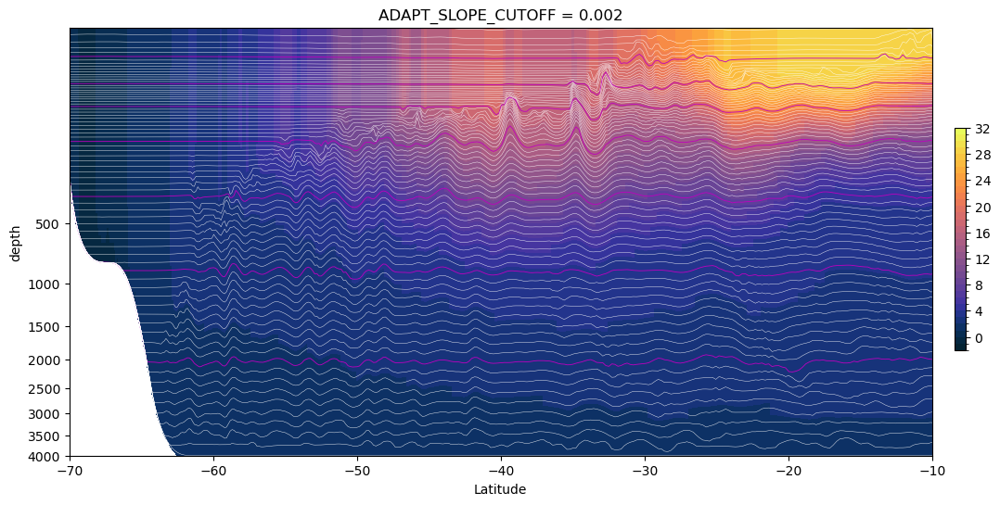

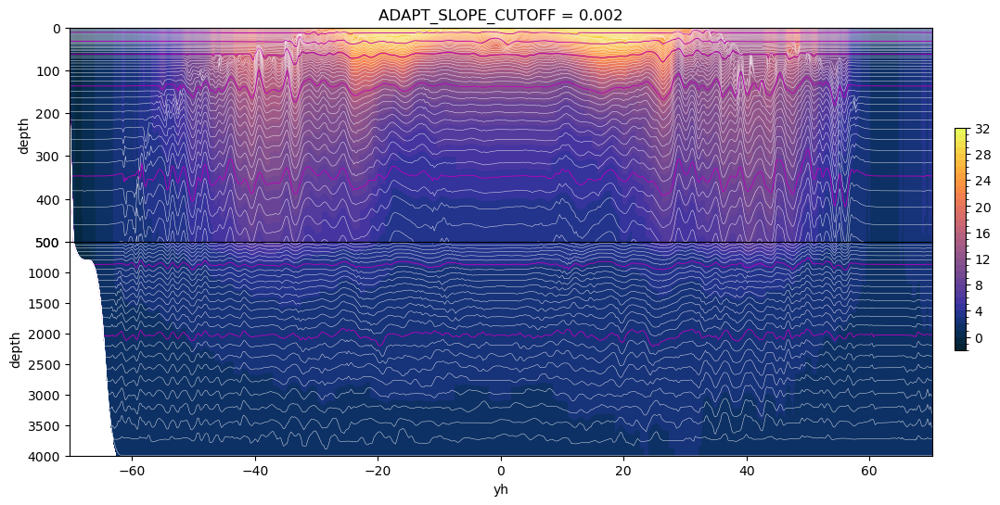

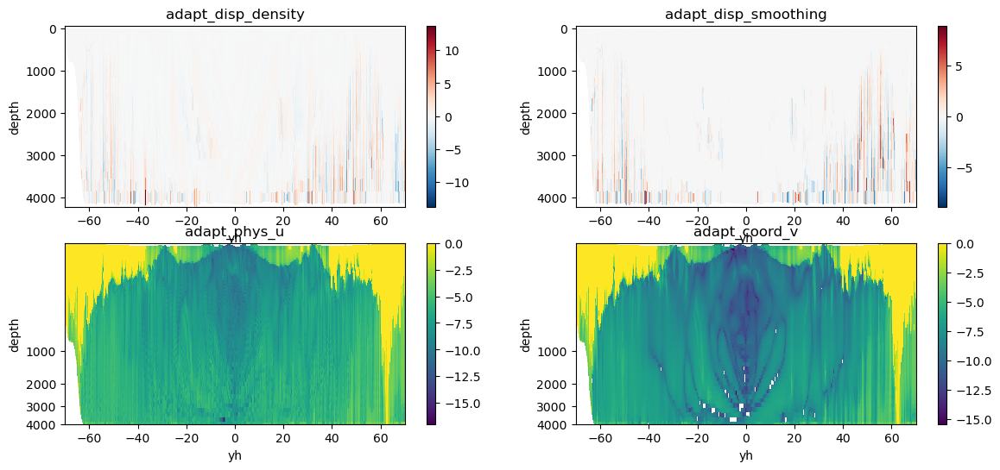

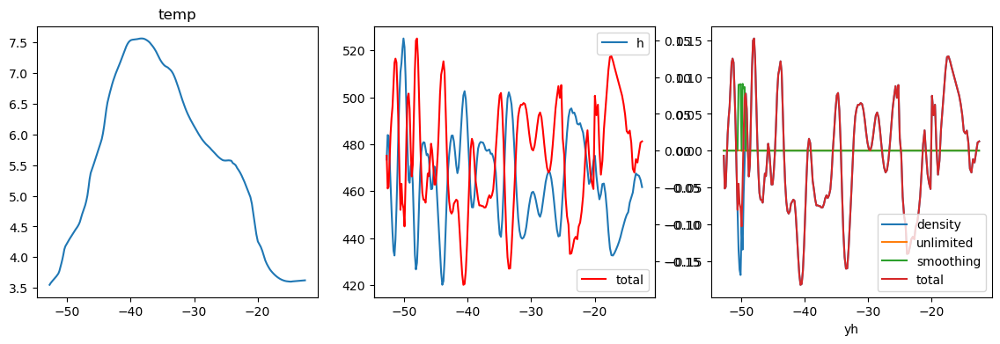

In [24]:

h_depth = np.cumsum(h[39,:,:],1)
new_temp = xr.DataArray(data=np.transpose(temp[39,:,:]),dims=["zl", "yh"],
                coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))        
spplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.002')
tpplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.002')

diagplot(diags)


In [25]:
np.save('/g/data/x77/amh157/anu-tub/diagnostics/state_sc002.npy',state_sc002,allow_pickle=True)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


## Larger slope cutoff


In [26]:
params = toml.load("/g/data/x77/amh157/anu-tub/diagnostics/params_adapt.toml")
params["ADAPT_SLOPE_CUTOFF"] =  0.01
cs = pyale.mom_init_cs(params); 

 log_version: MOM_domains                             , unknown
 MOM_domains                              REENTRANT_X:  T
 MOM_domains                              REENTRANT_Y:  F
 MOM_domains                              TRIPOLAR_N:  F
 MOM_domains                              OCEAN_OMP_THREADS:            1
 MOM_domains                              OCEAN_OMP_HYPER_THREAD:  F
 MOM_domains                              !SYMMETRIC_MEMORY_:  T
 MOM_domains                              NONBLOCKING_UPDATES:  F
 MOM_domains                              THIN_HALO_UPDATES:  T
 MOM_domains                              !STATIC_MEMORY_:  F
 MOM_domains                              NIGLOBAL:          160
 MOM_domains                              NJGLOBAL:          800
 MOM_domains                              NIHALO:            4
 MOM_domains                              NJHALO:            4
 MOM_domains                              MASKTABLE: 'MOM_mask_table'
 MOM_domains                         

In [27]:
pyale.load_mom_restart(cs, restart_filename)
adapt_cs = pyale.mom_init_regrid(cs, params, "ADAPTIVE")

 init_MOM_state INPUTDIR: '/g/data/x77/amh157/mom6/input/anu-tub'
 init_MOM_state REGRIDDING_COORDINATE_UNITS: 'm'
 init_MOM_state INTERPOLATION_SCHEME: 'P1M_H2'
 init_MOM_state DEFAULT_2018_ANSWERS:  F
 init_MOM_state REMAPPING_2018_ANSWERS:  F
 init_MOM_state BOUNDARY_EXTRAPOLATION:  F
 init_MOM_state ALE_COORDINATE_CONFIG                   : 'FNC1:2,4000,4.5,.01'
 init_MOM_state !ALE_RESOLUTION                          :    2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0099999999999998        2.0099999999999998        2.0200000000000000        2.0299999999999998        2.0499999999999998        2.0800000000000001        2.1099999999999999        2.1499999999999999        2.2100000000000000        2.2800000000000002        2.3700000000000001        2.4800000000000000        2.6099999999999999        2.7700000000000000        2.9500000000000002     

In [28]:
state_sc01 = pyale.accelerate_ale(cs, adapt_cs, iter=500, dt=3600,diags=["adapt_disp_density","adapt_disp_smoothing","adapt_disp_unlimited","adapt_phys_v","adapt_coord_v"])

h=state_sc01[0]
temp=state_sc01[1]
salt=state_sc01[2]
diags = state_sc01[3]

/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:78: RuntimeWarning: divide by zero encountered in log10
  diag_phys_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:92: RuntimeWarning: divide by zero encountered in log10
  diag_coord_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],


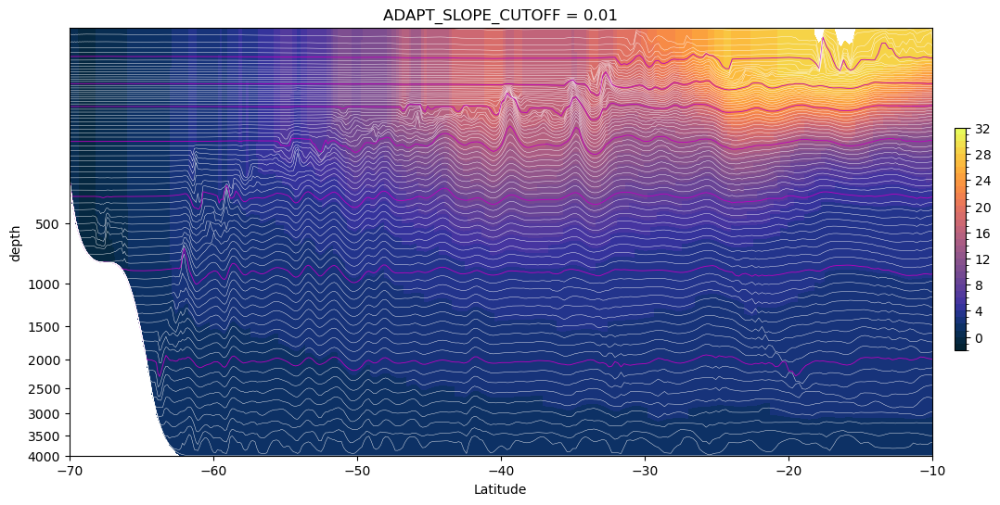

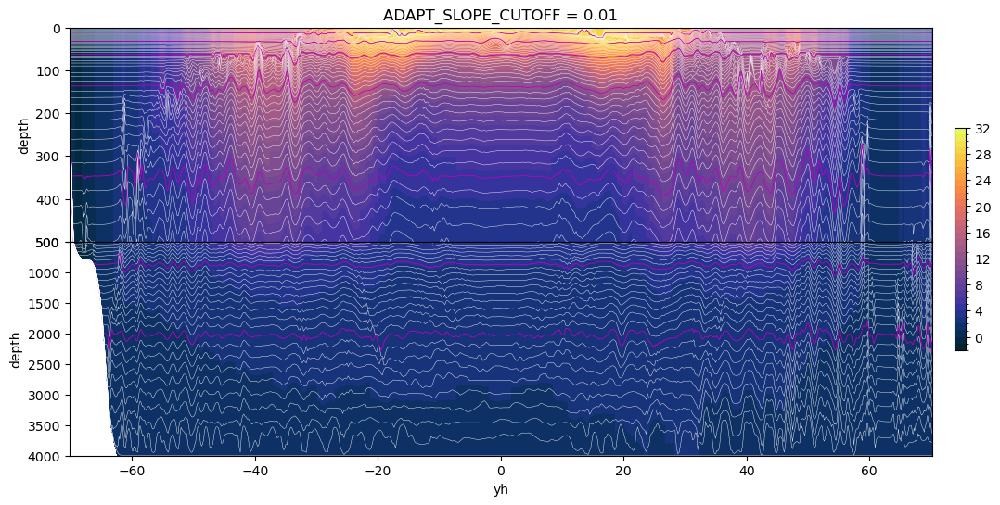

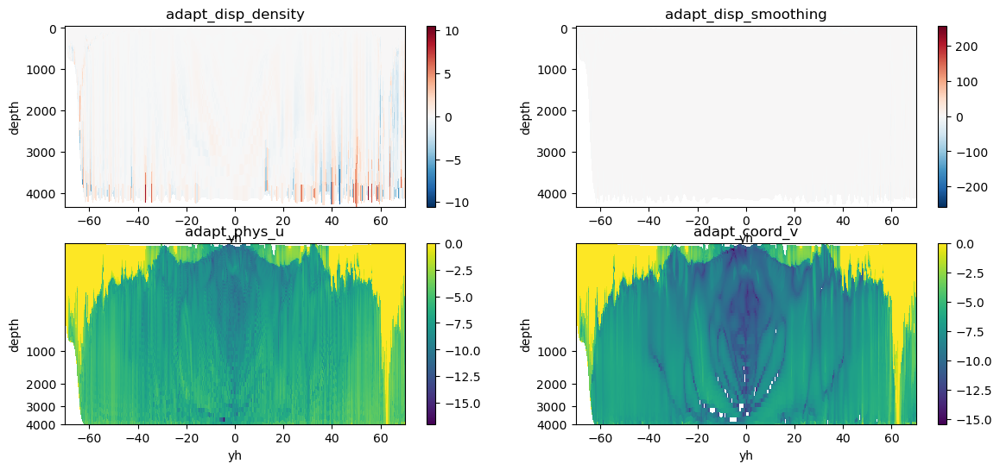

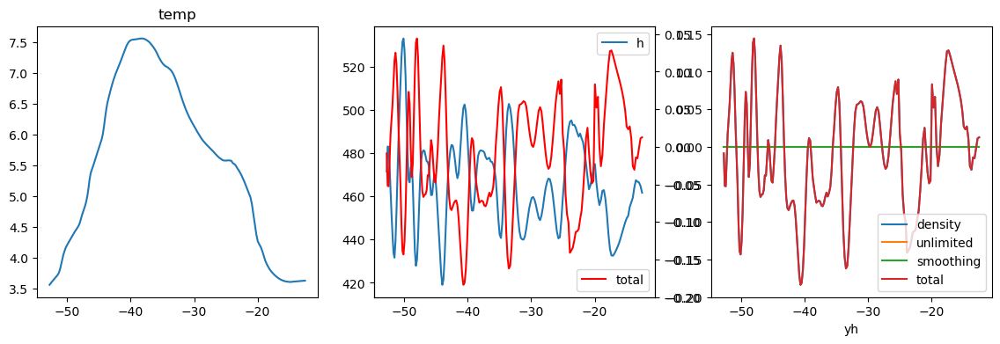

In [29]:
h_depth = np.cumsum(h[39,:,:],1)
new_temp = xr.DataArray(data=np.transpose(temp[39,:,:]),dims=["zl", "yh"],
                coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))        
spplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.01')
tpplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.01')

diagplot(diags)

In [30]:
np.save('/g/data/x77/amh157/anu-tub/diagnostics/state_sc01.npy',state_sc01,allow_pickle=True)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


## Smaller cutoff again!

In [31]:
params = toml.load("/g/data/x77/amh157/anu-tub/diagnostics/params_adapt.toml")
params["ADAPT_SLOPE_CUTOFF"] =  0.001
cs = pyale.mom_init_cs(params); 

 log_version: MOM_domains                             , unknown
 MOM_domains                              REENTRANT_X:  T
 MOM_domains                              REENTRANT_Y:  F
 MOM_domains                              TRIPOLAR_N:  F
 MOM_domains                              OCEAN_OMP_THREADS:            1
 MOM_domains                              OCEAN_OMP_HYPER_THREAD:  F
 MOM_domains                              !SYMMETRIC_MEMORY_:  T
 MOM_domains                              NONBLOCKING_UPDATES:  F
 MOM_domains                              THIN_HALO_UPDATES:  T
 MOM_domains                              !STATIC_MEMORY_:  F
 MOM_domains                              NIGLOBAL:          160
 MOM_domains                              NJGLOBAL:          800
 MOM_domains                              NIHALO:            4
 MOM_domains                              NJHALO:            4
 MOM_domains                              MASKTABLE: 'MOM_mask_table'
 MOM_domains                         

In [32]:
pyale.load_mom_restart(cs, restart_filename)
adapt_cs = pyale.mom_init_regrid(cs, params, "ADAPTIVE")

 init_MOM_state INPUTDIR: '/g/data/x77/amh157/mom6/input/anu-tub'
 init_MOM_state REGRIDDING_COORDINATE_UNITS: 'm'
 init_MOM_state INTERPOLATION_SCHEME: 'P1M_H2'
 init_MOM_state DEFAULT_2018_ANSWERS:  F
 init_MOM_state REMAPPING_2018_ANSWERS:  F
 init_MOM_state BOUNDARY_EXTRAPOLATION:  F
 init_MOM_state ALE_COORDINATE_CONFIG                   : 'FNC1:2,4000,4.5,.01'
 init_MOM_state !ALE_RESOLUTION                          :    2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0000000000000000        2.0099999999999998        2.0099999999999998        2.0200000000000000        2.0299999999999998        2.0499999999999998        2.0800000000000001        2.1099999999999999        2.1499999999999999        2.2100000000000000        2.2800000000000002        2.3700000000000001        2.4800000000000000        2.6099999999999999        2.7700000000000000        2.9500000000000002     

In [33]:
state_sc001 = pyale.accelerate_ale(cs, adapt_cs, iter=500, dt=3600,diags=["adapt_disp_density","adapt_disp_smoothing","adapt_disp_unlimited","adapt_phys_v","adapt_coord_v"])

h=state_sc001[0]
temp=state_sc001[1]
salt=state_sc001[2]
diags = state_sc001[3]

/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:78: RuntimeWarning: divide by zero encountered in log10
  diag_phys_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_phys_v'][43,4:-4,:-1])),dims=["zl", "yh"],
/jobfs/116605551.gadi-pbs/ipykernel_794886/3265222688.py:92: RuntimeWarning: divide by zero encountered in log10
  diag_coord_v = xr.DataArray(data=np.log10(np.transpose(diags['adapt_coord_v'][43,4:-4,:-1])),dims=["zl", "yh"],


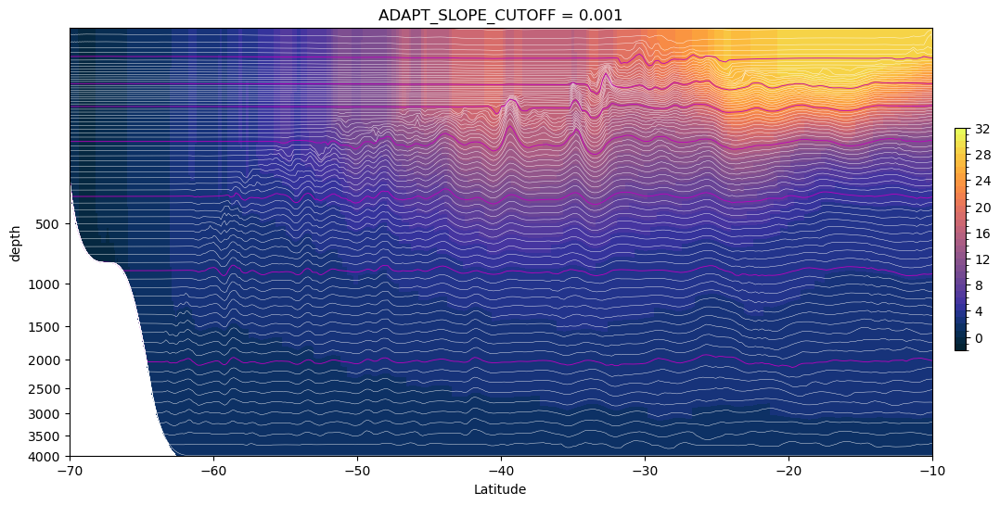

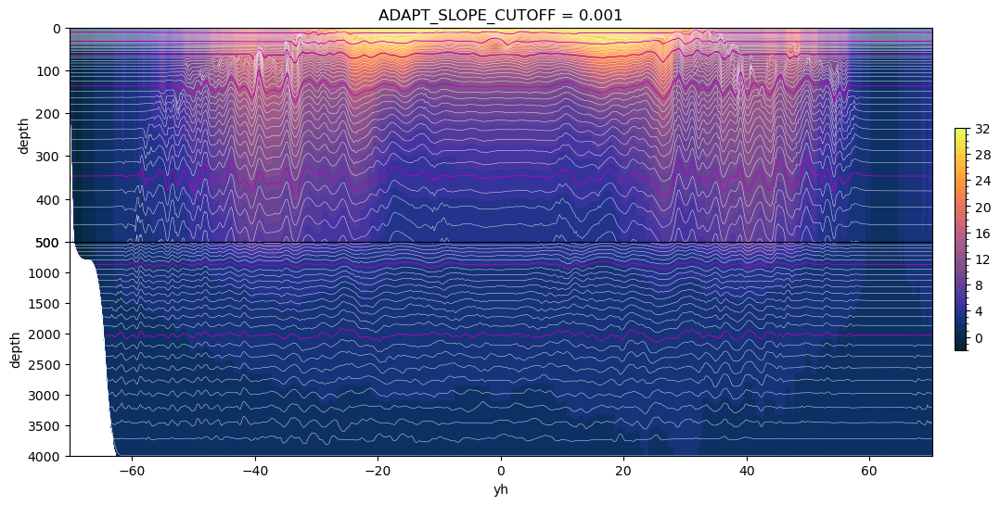

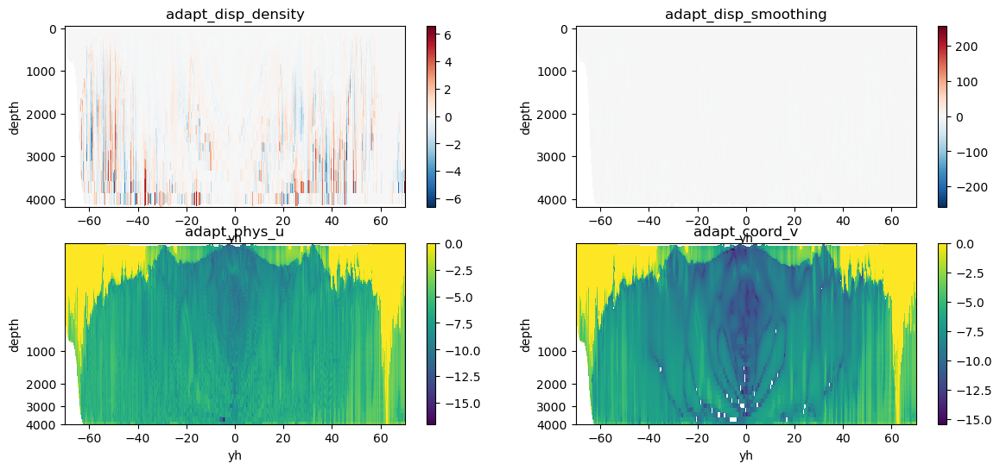

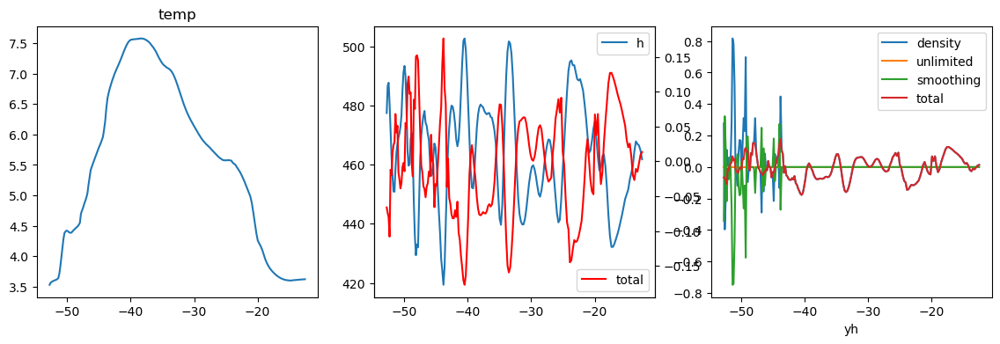

In [34]:
h_depth = np.cumsum(h[39,:,:],1)
new_temp = xr.DataArray(data=np.transpose(temp[39,:,:]),dims=["zl", "yh"],
                coords=dict(yh=(["yh"], ds2.lath.values),depth=(["zl", "yh"], np.transpose(h_depth))))        
spplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.001')
tpplot(new_temp,h_depth,vlev=vlev,cmap=cm.cm.thermal,title='ADAPT_SLOPE_CUTOFF = 0.001')

diagplot(diags)

In [ ]:
np.save('/g/data/x77/amh157/anu-tub/diagnostics/state_sc001.npy',state_sc001,allow_pickle=True)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)
